In [86]:
!pip install -U dataprep

In [87]:
!pip install pyastronomy

In [88]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, plot_confusion_matrix
from sklearn.linear_model import LogisticRegression
import plotly.express as px
import plotly.graph_objects as go
from dataprep.datasets import load_dataset
from dataprep.eda import plot
from dataprep.eda import plot_diff
from dataprep.eda import plot_correlation
from dataprep.eda import plot_missing
import math

In [89]:
path = "Desktop/Trabalho_IC/Star39552_balanced.csv"
df = pd.read_csv(path)
df

,Vmag,Plx,e_Plx,B-V,SpType,Amag,TargetClass
0,10.00,31.66,6.19,1.213,K7V,22.502556,1
1,8.26,3.21,1.00,1.130,K0III,15.792525,0
2,8.27,12.75,1.06,0.596,F9V,18.797552,1
3,6.54,5.23,0.76,1.189,K1III,15.132508,0
4,8.52,0.96,0.72,0.173,B8V,13.431356,1
...,...,...,...,...,...,...,...
39547,5.83,0.17,0.52,0.474,B7Iab,6.982245,0
39548,7.05,18.12,0.92,0.424,F5V,18.340790,1
39549,9.21,3.89,1.46,0.227,A1IV,17.159748,1
39550,9.01,2.13,1.46,1.467,M5III,15.651898,0


In [90]:
df["Vmag"] = pd.to_numeric(df["Vmag"], downcast="float", errors='coerce')
df["Plx"] = pd.to_numeric(df["Plx"], downcast="float", errors='coerce')
df["e_Plx"] = pd.to_numeric(df["e_Plx"], downcast="float", errors='coerce')
df["B-V"] = pd.to_numeric(df["B-V"], downcast="float", errors='coerce')

In [91]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

import pandas

In [92]:
from dataprep.eda import create_report

report = create_report(df, title='My Report')


  0%|                                                                                         | 0/1167 [00:00<…

My Report
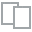
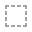
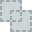
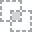
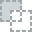
...
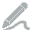
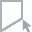
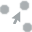
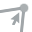
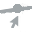

In [93]:
report

Redução dos erros

In [94]:
threshold = df['e_Plx'].mean() + 0.5

df = df[df['e_Plx'] < threshold ]

A formula para calcular a temperatura:
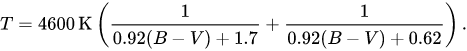

In [95]:
df["Temp"] = 4600*((1/(0.92*df['B-V']+1.7))+(1/(0.92*df['B-V']+0.62)))

C:\Users\joaob\AppData\Local\Temp\ipykernel_16044\1817567433.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [96]:
from __future__ import print_function, division 
from PyAstronomy import pyasl
b = pyasl.BallesterosBV_T()
bv = 0.482
# Convert B-V into effective temperature
teff = b.bv2T(0.482)
print("B-V = {0:4.2f} mag -> Teff = {1:4.0f} K".format(bv, teff))
# Convert effective temperature into B-V color
teff = 4568.0
bv = b.t2bv(teff)
print("Teff = {0:4.0f} K -> B-V = {1:4.2f} mag".format(teff, bv))

B-V = 0.48 mag -> Teff = 6472 K
Teff = 4568 K -> B-V = 1.08 mag


Calculo da Luminosidade
M = -2.5 * log₁₀(L / L₀)
Onde M é a magnitude absoluta
L é a luminosidade
L₀ é o ponto zero da luminosidade, que no caso é 3.0128 * 10²⁸ W. 

In [97]:
df["Luminosity"] = ((10)**(df['Amag']/(-2.5)))
df = df.reset_index(drop=True)

C:\Users\joaob\AppData\Local\Temp\ipykernel_16044\1895387896.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [98]:
df['Radius']= np.sqrt(((df['Luminosity'])*(3.827*(10**26)))/(4*3.141593*(5.7*(10**(-8)))*(df['Temp']**4)))

In [99]:
df['ColdTypes'] = df['SpType']

In [100]:
df["GigOrDwf"] = df["TargetClass"]

In [101]:
df['GigOrDwf'].value_counts()

0    18902
1    17286
Name: GigOrDwf, dtype: int64

# Aqui começa a ter dados interessantes, pois Temos uma proporção de quantas estrelas nesse conjunto, são gigantes, agora só resta descobrir quais são vermelhas

In [102]:
colors_blue = ["#132C33", "#264D58", '#17869E', '#51C4D3', '#B4DBE9']
colors_dark = ["#1F1F1F", "#313131", '#636363', '#AEAEAE', '#DADADA']

In [103]:
d= pd.DataFrame(df['GigOrDwf'].value_counts())
fig = px.pie(d,values='GigOrDwf',names=['Giants','Dwarfs'],hole=0.4,
            color_discrete_sequence=[colors_blue[3],colors_dark[3]],
             labels={'label':'GigOrDwf','GigOrDwf':'No. Of Samples'})


fig.add_annotation(text='Need to resample the data<br> to get a balanced dataset',
                   x=1.2,y=0.9,showarrow=False,font_size=12,opacity=0.7,font_family='arial')
fig.add_annotation(text='Classified Stars',
                   x=0.5,y=0.5,showarrow=False,font_size=12,opacity=0.7,font_family='arial')

fig.update_layout(
    font_family='arial',
    title=dict(text='Star Types',x=0.47,y=0.98,
               font=dict(color=colors_dark[2],size=20)),
    legend=dict(x=0.37,y=-0.05,orientation='h',traceorder='reversed'),
    hoverlabel=dict(bgcolor='white'))

fig.update_traces(textposition='outside', textinfo='percent+label')

In [104]:
def ColdTypes(row):
    if row['ColdTypes'].startswith('M') or row['ColdTypes'].startswith('K') or row['ColdTypes'].startswith('G'):
        return 1
    else:
        return 0

In [105]:
df['ColdTypes'] = df.apply (lambda row: ColdTypes(row), axis=1)

In [106]:
d= pd.DataFrame(df['ColdTypes'].value_counts())
fig = px.pie(d,values='ColdTypes',names=['Cold','Hot'],hole=0.4,
            color_discrete_sequence=[colors_blue[3],colors_dark[3]],
             labels={'label':'GiantOrDwarf','GiantOrDwarf':'No. Of Samples'})


fig.add_annotation(text='Need to resample the data<br> to get a balanced dataset',
                   x=1.2,y=0.9,showarrow=False,font_size=12,opacity=0.7,font_family='arial')
fig.add_annotation(text='Classified Stars',
                   x=0.5,y=0.5,showarrow=False,font_size=12,opacity=0.7,font_family='arial')

fig.update_layout(
    font_family='arial',
    title=dict(text='Star Types',x=0.47,y=0.98,
               font=dict(color=colors_dark[2],size=20)),
    legend=dict(x=0.37,y=-0.05,orientation='h',traceorder='reversed'),
    hoverlabel=dict(bgcolor='white'))

fig.update_traces(textposition='outside', textinfo='percent+label')

Apagando os campos de luminosidade negativa para fazer o calculo 

In [107]:
df = df[df.Luminosity > 0]

In [108]:
df = df.reset_index(drop=True)

In [109]:
df['Distance(Km)'] = ((1/df['Plx'])*(3.08567758149137*(10**13)))

In [110]:
df['Distance(parsec)'] = ((1/df['Plx']))


In [111]:
df.describe().T


,count,mean,std,min,25%,50%,75%,max
Vmag,36188.0,7.805468e+00,1.265667e+00,-6.200000e-01,7.110000e+00,8.060000e+00,8.730000e+00,1.123000e+01
Plx,36188.0,6.899062e+00,1.130423e+01,-6.680000e+00,2.420000e+00,4.360000e+00,8.050000e+00,7.421200e+02
e_Plx,36188.0,9.768490e-01,2.573650e-01,4.200000e-01,7.800000e-01,9.500000e-01,1.160000e+00,1.600000e+00
B-V,36188.0,7.501073e-01,5.218266e-01,-4.000000e-01,3.450000e-01,7.350000e-01,1.140000e+00,3.440000e+00
Amag,36188.0,1.590034e+01,2.343616e+00,-3.499999e-01,1.467415e+01,1.592194e+01,1.736244e+01,2.589491e+01
TargetClass,36188.0,4.776722e-01,4.995081e-01,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00
Temp,36188.0,6.148885e+03,2.283906e+03,2.160956e+03,4.429929e+03,5.484699e+03,7.187353e+03,2.170742e+04
Luminosity,36188.0,1.200379e-04,7.762207e-03,4.385658e-11,1.135070e-07,4.277843e-07,1.350024e-06,1.380384e+00
Radius,36188.0,1.553198e+06,1.055151e+07,6.221289e+03,1.531398e+05,4.343471e+05,1.066614e+06,6.484185e+08
ColdTypes,36188.0,5.669006e-01,4.955109e-01,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


In [112]:
df

,Vmag,Plx,e_Plx,B-V,SpType,Amag,TargetClass,Temp,Luminosity,Radius,ColdTypes,GigOrDwf,Distance(Km),Distance(parsec)
0,8.26,3.210000,1.00,1.130,K0III,15.792525,0,4450.829102,4.819367e-07,8.100280e+05,1,0,9.612702e+12,0.311526
1,8.27,12.750000,1.06,0.596,F9V,18.797552,1,5983.249512,3.026768e-08,1.123317e+05,0,1,2.420139e+12,0.078431
2,6.54,5.230000,0.76,1.189,K1III,15.132508,0,4330.424316,8.851091e-07,1.159643e+06,1,0,5.899957e+12,0.191205
3,8.52,0.960000,0.72,0.173,B8V,13.431356,1,8378.029297,4.240896e-06,6.781596e+05,0,1,3.214248e+13,1.041667
4,6.09,6.020000,0.95,0.040,B8IVn,14.987983,1,9652.203125,1.011130e-06,2.494809e+05,0,1,5.125710e+12,0.166113
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36183,5.83,0.170000,0.52,0.474,B7Iab,6.982245,0,6509.208008,1.611025e-03,2.189685e+07,0,0,1.815104e+14,5.882353
36184,7.05,18.120001,0.92,0.424,F5V,18.340790,1,6754.967285,4.609820e-08,1.087633e+05,0,1,1.702912e+12,0.055188
36185,9.21,3.890000,1.46,0.227,A1IV,17.159748,1,7959.765137,1.368046e-07,1.349388e+05,0,1,7.932333e+12,0.257069
36186,9.01,2.130000,1.46,1.467,M5III,15.651898,0,3843.826904,5.485810e-07,1.158723e+06,1,0,1.448675e+13,0.469484


In [113]:
def Main_Seq(row):
    if row['GigOrDwf'] == 1 :
        for i in range(len(df['SpType'])):
            if "V" in df.loc[i,'SpType']:
                return 1
               
    else:
        return 0
    

In [114]:
df['MainSeq'] = df.apply (lambda row: Main_Seq(row), axis=1)

In [115]:
df["MainSeq"] = df["MainSeq"].fillna(0)

In [116]:
df['MainSeq'].value_counts()

0    18902
1    17286
Name: MainSeq, dtype: int64

Sun Lum = 3.846 × 10**26
Sun Mass = 1.9891e30

In [117]:
df['Mass'] = (np.sqrt(np.sqrt(df['Luminosity']/(3.846*(10**26)))))*(1.9891*(10**30))


In [118]:
fig = px.scatter(df,
                 x="B-V", y='Mass', size="Mass",color='GigOrDwf',
                  size_max=60,
                 template='plotly_dark', title='Star Type vs Mass as size')
fig.show()

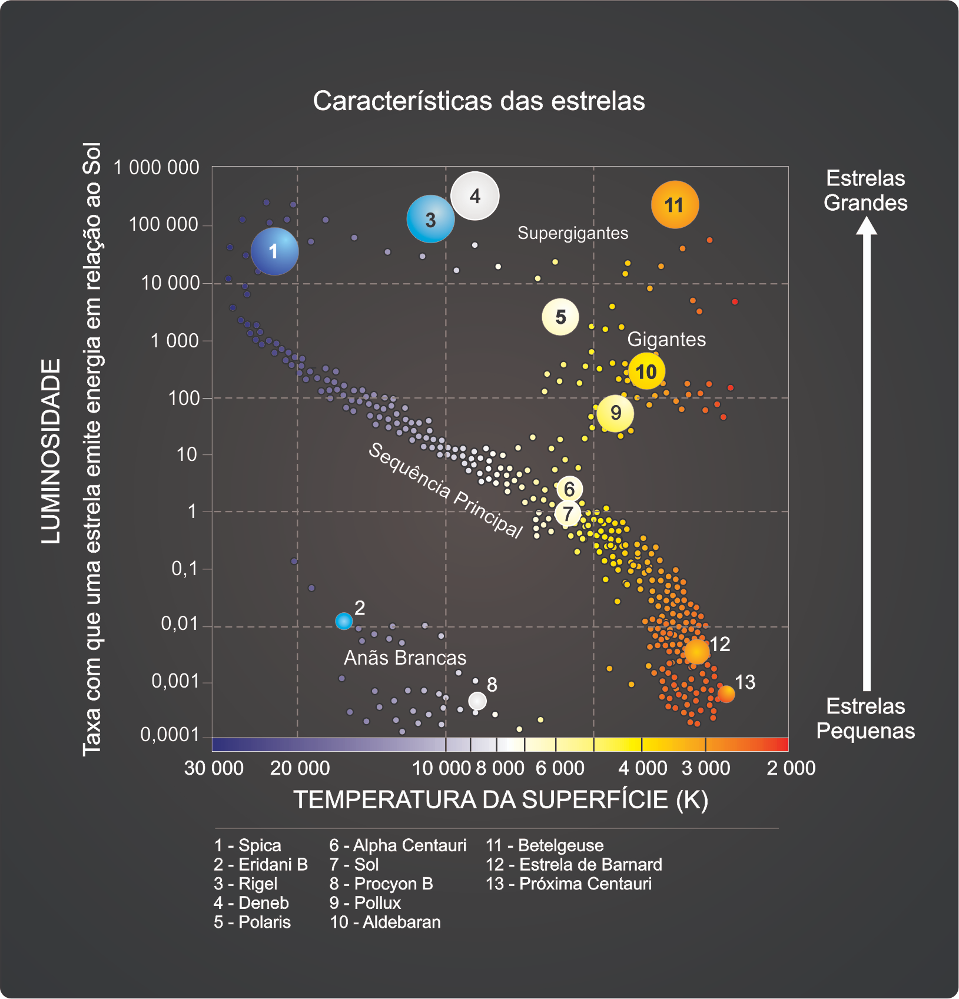

In [119]:
df

,Vmag,Plx,e_Plx,B-V,SpType,Amag,TargetClass,Temp,Luminosity,Radius,ColdTypes,GigOrDwf,Distance(Km),Distance(parsec),MainSeq,Mass
0,8.26,3.210000,1.00,1.130,K0III,15.792525,0,4450.829102,4.819367e-07,8.100280e+05,1,0,9.612702e+12,0.311526,0,1.183455e+22
1,8.27,12.750000,1.06,0.596,F9V,18.797552,1,5983.249512,3.026768e-08,1.123317e+05,0,1,2.420139e+12,0.078431,1,5.924464e+21
2,6.54,5.230000,0.76,1.189,K1III,15.132508,0,4330.424316,8.851091e-07,1.159643e+06,1,0,5.899957e+12,0.191205,0,1.377696e+22
3,8.52,0.960000,0.72,0.173,B8V,13.431356,1,8378.029297,4.240896e-06,6.781596e+05,0,1,3.214248e+13,1.041667,1,2.038303e+22
4,6.09,6.020000,0.95,0.040,B8IVn,14.987983,1,9652.203125,1.011130e-06,2.494809e+05,0,1,5.125710e+12,0.166113,1,1.424315e+22
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36183,5.83,0.170000,0.52,0.474,B7Iab,6.982245,0,6509.208008,1.611025e-03,2.189685e+07,0,0,1.815104e+14,5.882353,0,8.998702e+22
36184,7.05,18.120001,0.92,0.424,F5V,18.340790,1,6754.967285,4.609820e-08,1.087633e+05,0,1,1.702912e+12,0.055188,1,6.581506e+21
36185,9.21,3.890000,1.46,0.227,A1IV,17.159748,1,7959.765137,1.368046e-07,1.349388e+05,0,1,7.932333e+12,0.257069,1,8.638324e+21
36186,9.01,2.130000,1.46,1.467,M5III,15.651898,0,3843.826904,5.485810e-07,1.158723e+06,1,0,1.448675e+13,0.469484,0,1.222403e+22


In [120]:
df['RedStars'] = df['SpType']

In [121]:
def RedStars(row):
    if row['RedStars'].endswith('III') and row['RedStars'].startswith('M') or row['RedStars'].startswith('K'):  
        return 1
    else:
        return 0

In [122]:
df['RedStars'] = df.apply(lambda row: RedStars(row), axis=1)

In [123]:
df

,Vmag,Plx,e_Plx,B-V,SpType,Amag,TargetClass,Temp,Luminosity,Radius,ColdTypes,GigOrDwf,Distance(Km),Distance(parsec),MainSeq,Mass,RedStars
0,8.26,3.210000,1.00,1.130,K0III,15.792525,0,4450.829102,4.819367e-07,8.100280e+05,1,0,9.612702e+12,0.311526,0,1.183455e+22,1
1,8.27,12.750000,1.06,0.596,F9V,18.797552,1,5983.249512,3.026768e-08,1.123317e+05,0,1,2.420139e+12,0.078431,1,5.924464e+21,0
2,6.54,5.230000,0.76,1.189,K1III,15.132508,0,4330.424316,8.851091e-07,1.159643e+06,1,0,5.899957e+12,0.191205,0,1.377696e+22,1
3,8.52,0.960000,0.72,0.173,B8V,13.431356,1,8378.029297,4.240896e-06,6.781596e+05,0,1,3.214248e+13,1.041667,1,2.038303e+22,0
4,6.09,6.020000,0.95,0.040,B8IVn,14.987983,1,9652.203125,1.011130e-06,2.494809e+05,0,1,5.125710e+12,0.166113,1,1.424315e+22,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36183,5.83,0.170000,0.52,0.474,B7Iab,6.982245,0,6509.208008,1.611025e-03,2.189685e+07,0,0,1.815104e+14,5.882353,0,8.998702e+22,0
36184,7.05,18.120001,0.92,0.424,F5V,18.340790,1,6754.967285,4.609820e-08,1.087633e+05,0,1,1.702912e+12,0.055188,1,6.581506e+21,0
36185,9.21,3.890000,1.46,0.227,A1IV,17.159748,1,7959.765137,1.368046e-07,1.349388e+05,0,1,7.932333e+12,0.257069,1,8.638324e+21,0
36186,9.01,2.130000,1.46,1.467,M5III,15.651898,0,3843.826904,5.485810e-07,1.158723e+06,1,0,1.448675e+13,0.469484,0,1.222403e+22,1


In [124]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix,accuracy_score, classification_report

Se for igual a 1 , ela é uma gigante vermelha

In [125]:
Positive = df[df.RedStars == 1]
Negative = df[df.RedStars == 0]

In [126]:
num_of_positive = Positive.shape[0]
num_of_negative = Negative.shape[0]
print("Positive(1):",num_of_positive)
print("Negative(0):",num_of_negative)

Positive(1): 13129
Negative(0): 23059


Inicio do Treinamento do modelo 

Separação do Label

In [127]:
Positive = df[df.RedStars == 1]
Negative = df[df.RedStars == 0]

In [128]:
num_of_positive = Positive.shape[0]
num_of_negative = Negative.shape[0]
print("Positive(1):",num_of_positive)
print("Negative(0):",num_of_negative)

Positive(1): 13129
Negative(0): 23059


In [129]:
from sklearn.utils import resample

In [130]:
# Downsample majority class
df_positive_downsampled = resample(Positive, 
                                replace=True,    # sample without replacement
                                n_samples=num_of_negative,     # to match minority class
                                random_state=1) # reproducible results
 
## Combine minority class with downsampled majority class
df_downsampled = pd.concat([df_positive_downsampled, Negative])

In [131]:
df_downsampled['RedStars'].value_counts()

1    23059
0    23059
Name: RedStars, dtype: int64

In [132]:
df.columns

Index(['Vmag', 'Plx', 'e_Plx', 'B-V', 'SpType', 'Amag', 'TargetClass', 'Temp',
       'Luminosity', 'Radius', 'ColdTypes', 'GigOrDwf', 'Distance(Km)',
       'Distance(parsec)', 'MainSeq', 'Mass', 'RedStars'],
      dtype='object')

In [148]:
y = df['RedStars']
 
x = df[['B-V', 'Temp', 'Luminosity', 'Radius', 'Distance(Km)', 'ColdTypes', 'GigOrDwf', 'Mass']]

In [149]:
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size = 0.35, random_state=0)

In [135]:
scaler = StandardScaler()

In [136]:
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

In [137]:
x_train.shape

(23522, 8)

In [138]:
x_test.shape

(12666, 8)

# KNN

In [139]:
from sklearn.neighbors import KNeighborsClassifier

In [140]:
star_predictor = KNeighborsClassifier(n_neighbors=3)
star_predictor.fit(x_train, y_train)

KNeighborsClassifier(n_neighbors=3)

In [141]:
print('the score on train dataset is') 
print(star_predictor.score(x_train, y_train))

the score on train dataset is
0.944477510415781


In [142]:
y_pred = star_predictor.predict(x_test)

In [146]:
from sklearn.metrics import roc_curve

fpr, tpr, thresholds = roc_curve(y_test, y_pred)

Accuracy :  0.9069161534817622
              precision    recall  f1-score   support

           0       0.94      0.91      0.93      7988
           1       0.86      0.89      0.88      4678

    accuracy                           0.91     12666
   macro avg       0.90      0.90      0.90     12666
weighted avg       0.91      0.91      0.91     12666



<AxesSubplot:>

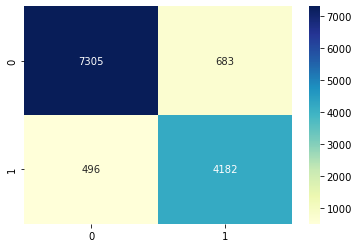

In [151]:
print("Accuracy : ", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))
sns.heatmap(confusion_matrix(y_test, y_pred),annot=True,fmt='',cmap='YlGnBu')

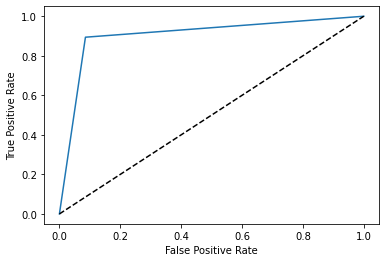

In [152]:
plt.plot(fpr, tpr)  
plt.xlabel("False Positive Rate")  
plt.ylabel("True Positive Rate")  
plt.plot([0, 1], [0, 1], "k--")

plt.show()

# ANN

In [87]:
import tensorflow as tf

In [88]:
ann = tf.keras.models.Sequential()

In [89]:
ann.add(tf.keras.layers.Dense(units = 64, activation = 'relu'))
ann.add(tf.keras.layers.Dense(units = 32, activation = 'relu'))
ann.add(tf.keras.layers.Dense(units = 1, activation = 'sigmoid'))

In [90]:
ann.compile(optimizer='adam', loss='binary_crossentropy', metrics= ['accuracy'])

In [91]:
ann.fit(x_train, y_train, epochs=100, batch_size=32)

Epoch 1/100
736/736 [==============================] - 3s 2ms/step - loss: 0.2461 - accuracy: 0.8956
Epoch 2/100
736/736 [==============================] - 2s 2ms/step - loss: 0.2053 - accuracy: 0.9143
Epoch 3/100
736/736 [==============================] - 2s 2ms/step - loss: 0.1989 - accuracy: 0.9168
Epoch 4/100
736/736 [==============================] - 2s 2ms/step - loss: 0.1957 - accuracy: 0.9171
Epoch 5/100
736/736 [==============================] - 2s 2ms/step - loss: 0.1942 - accuracy: 0.9172
Epoch 6/100
736/736 [==============================] - 2s 2ms/step - loss: 0.1932 - accuracy: 0.9182
Epoch 7/100
736/736 [==============================] - 2s 2ms/step - loss: 0.1923 - accuracy: 0.9196
Epoch 8/100
736/736 [==============================] - 2s 2ms/step - loss: 0.1918 - accuracy: 0.9185
Epoch 9/100
736/736 [==============================] - 2s 3ms/step - loss: 0.1909 - accuracy: 0.9188
Epoch 10/100
736/736 [==============================] - 2s 3ms/step - loss: 0.1907 - accura

In [97]:
y_pred = ann.predict(x_test)
y_pred = (y_pred > 0.5)

396/396 [==============================] - 1s 1ms/step


In [98]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.95      0.92      0.93      7988
           1       0.87      0.91      0.89      4678

    accuracy                           0.92     12666
   macro avg       0.91      0.92      0.91     12666
weighted avg       0.92      0.92      0.92     12666



<AxesSubplot:>

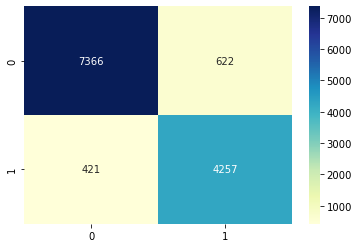

In [99]:
sns.heatmap(confusion_matrix(y_test, y_pred),annot=True,fmt='',cmap='YlGnBu')

In [100]:
print("Accuracy : ", accuracy_score(y_test, y_pred))

Accuracy :  0.9176535607137217


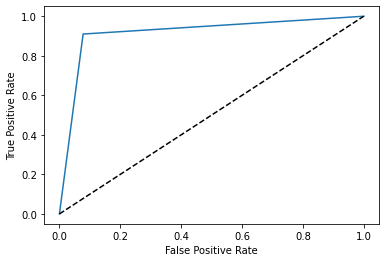

In [101]:
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plt.plot(fpr, tpr)  
plt.xlabel("False Positive Rate")  
plt.ylabel("True Positive Rate")  
plt.plot([0, 1], [0, 1], "k--")

plt.show()

REFERÊNCIA

@misc{Ku_KaggleStellar,
  author={Wing-Fung Ku},
  title={Star Categorization Giants And Dwarfs Dataset, vinesmsuic},
  month={Jul},
  year={2020},
  howpublished={\url{https://www.kaggle.com/datasets/vinesmsuic/star-categorization-giants-and-dwarfs}},
}


